# Wavelet

### importacion de librerias


In [1]:
import cv2
import pywt
import numpy as np
import matplotlib.pyplot as plt
import os
import test_wavelet
%load_ext autoreload
%autoreload 2
%matplotlib inline

### Recoleccion de rutas


In [6]:
pies_paths = test_wavelet.get_file_paths('PAIByB-2')
noise_paths = test_wavelet.get_file_paths('PAIByB-1')

# Punto 1.5 Estimacion del ruido con wavelet

## Ruido

### inicializacion de variables

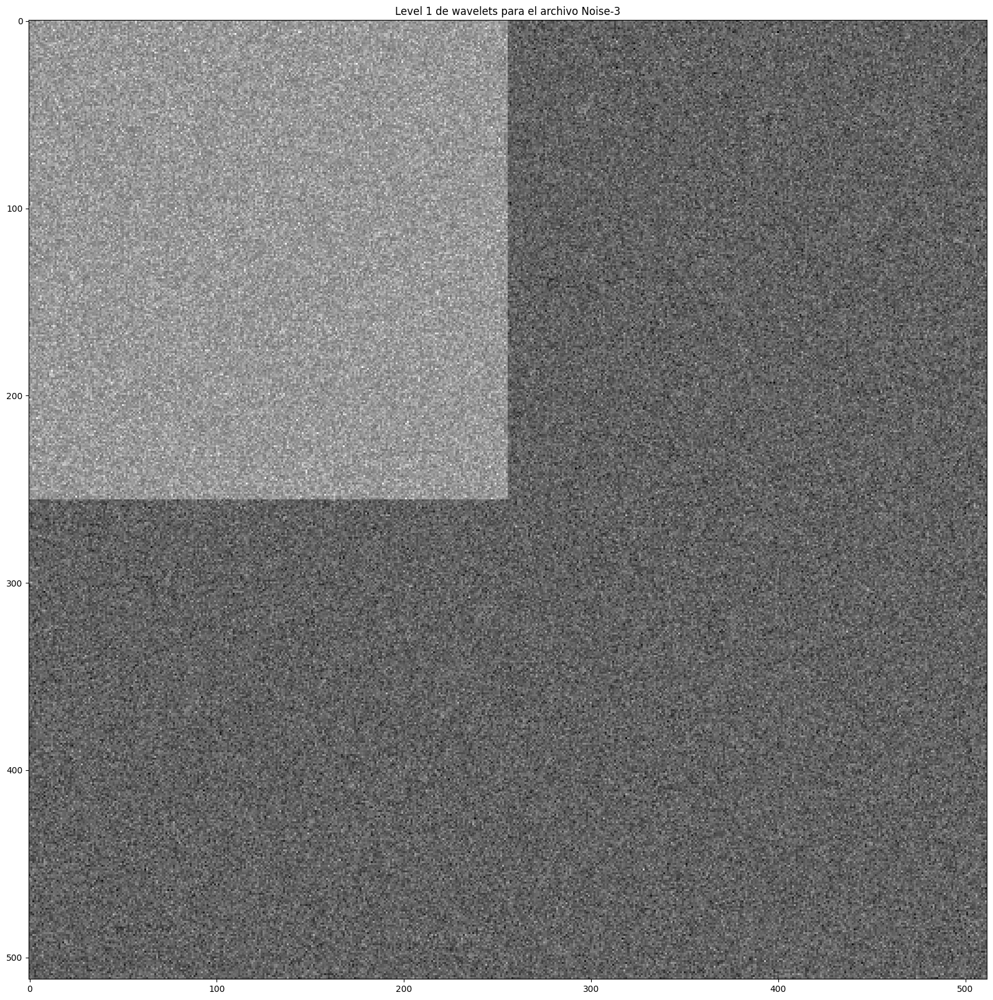

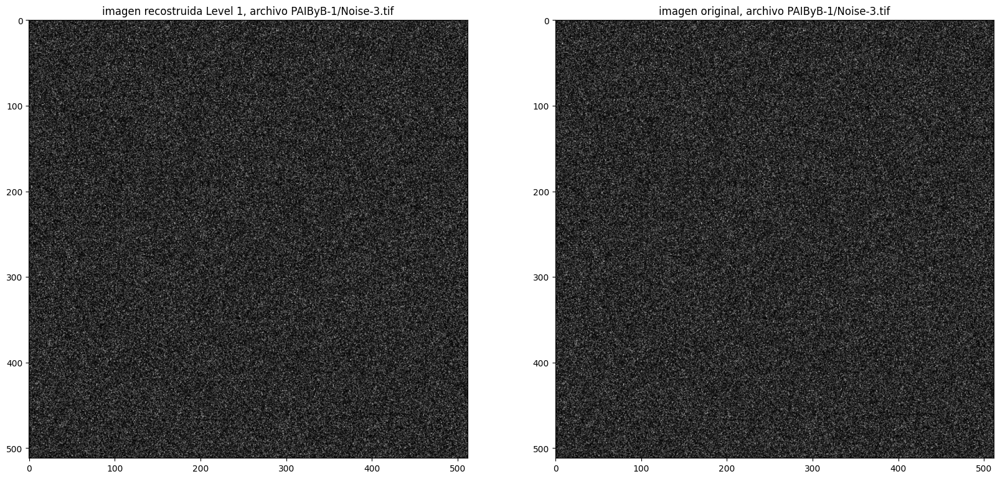

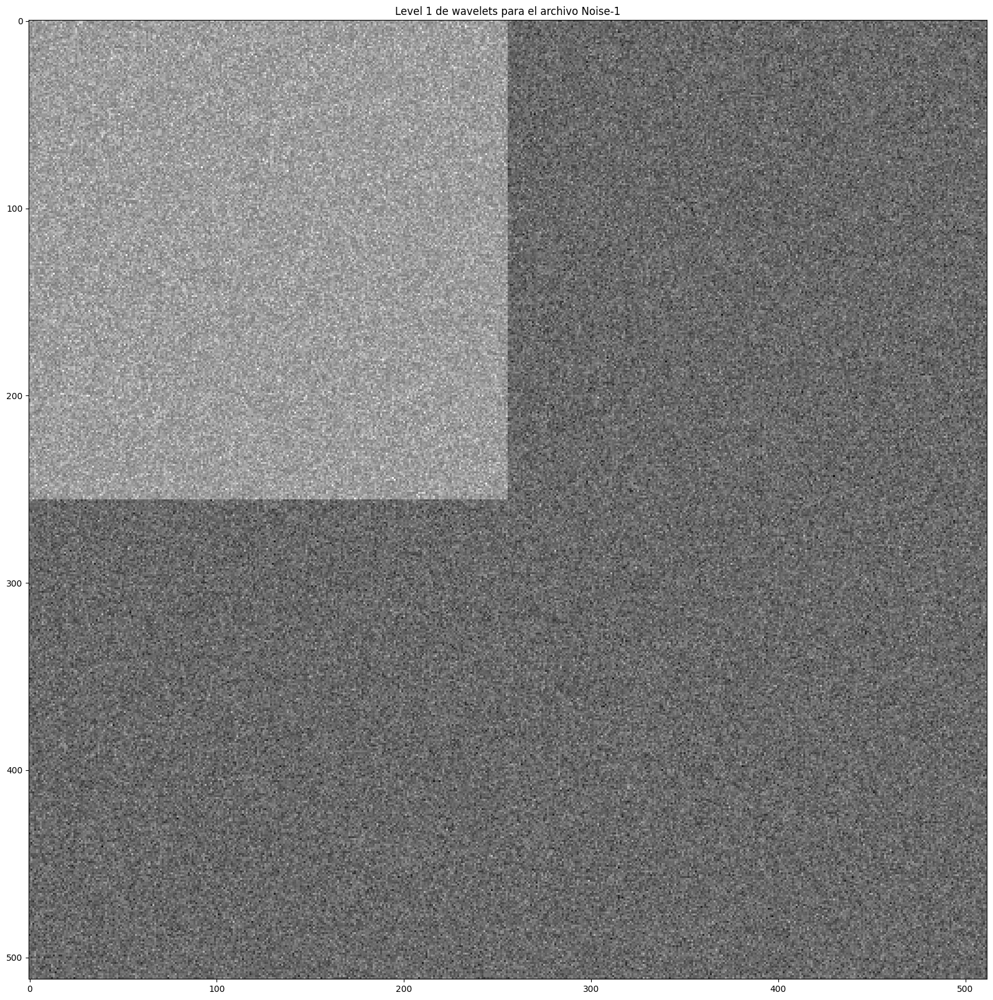

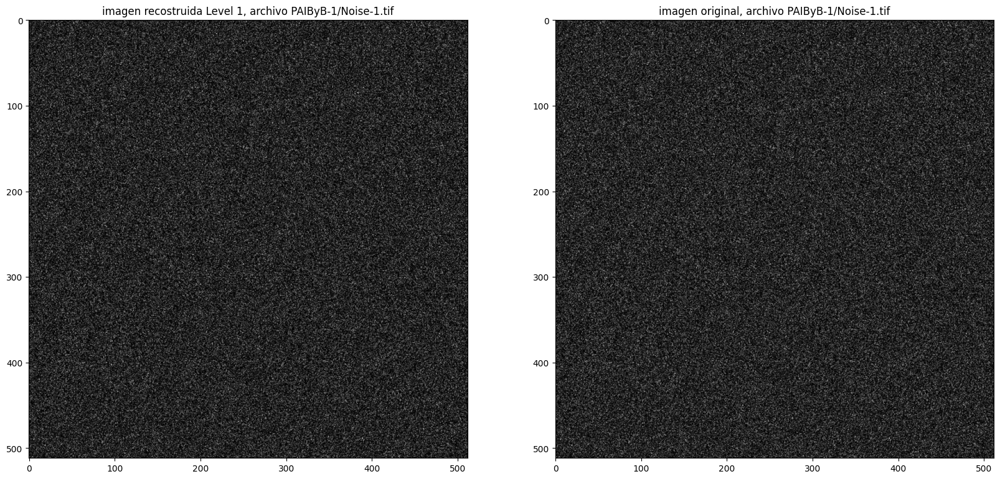

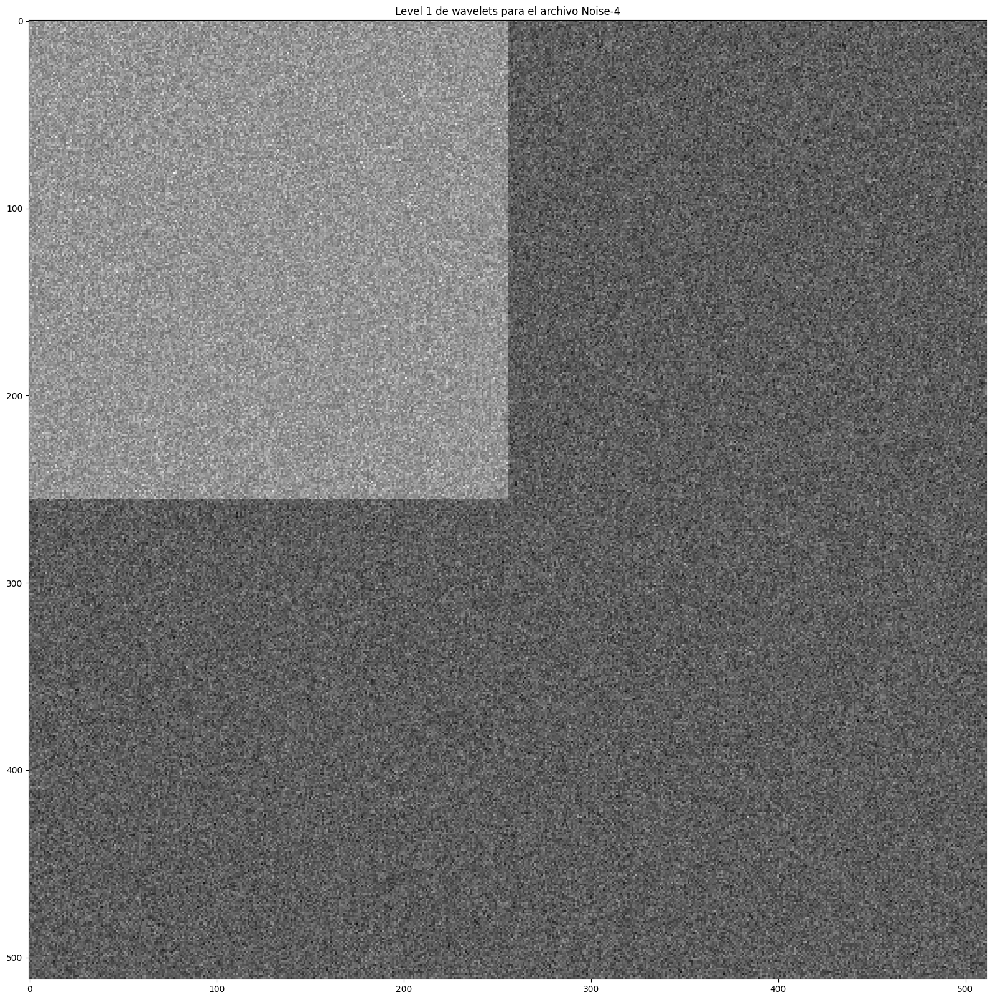

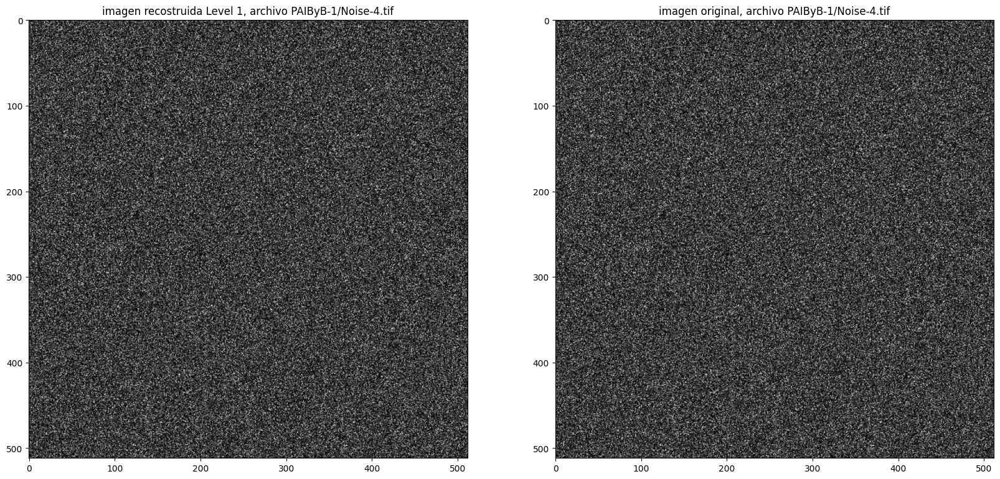

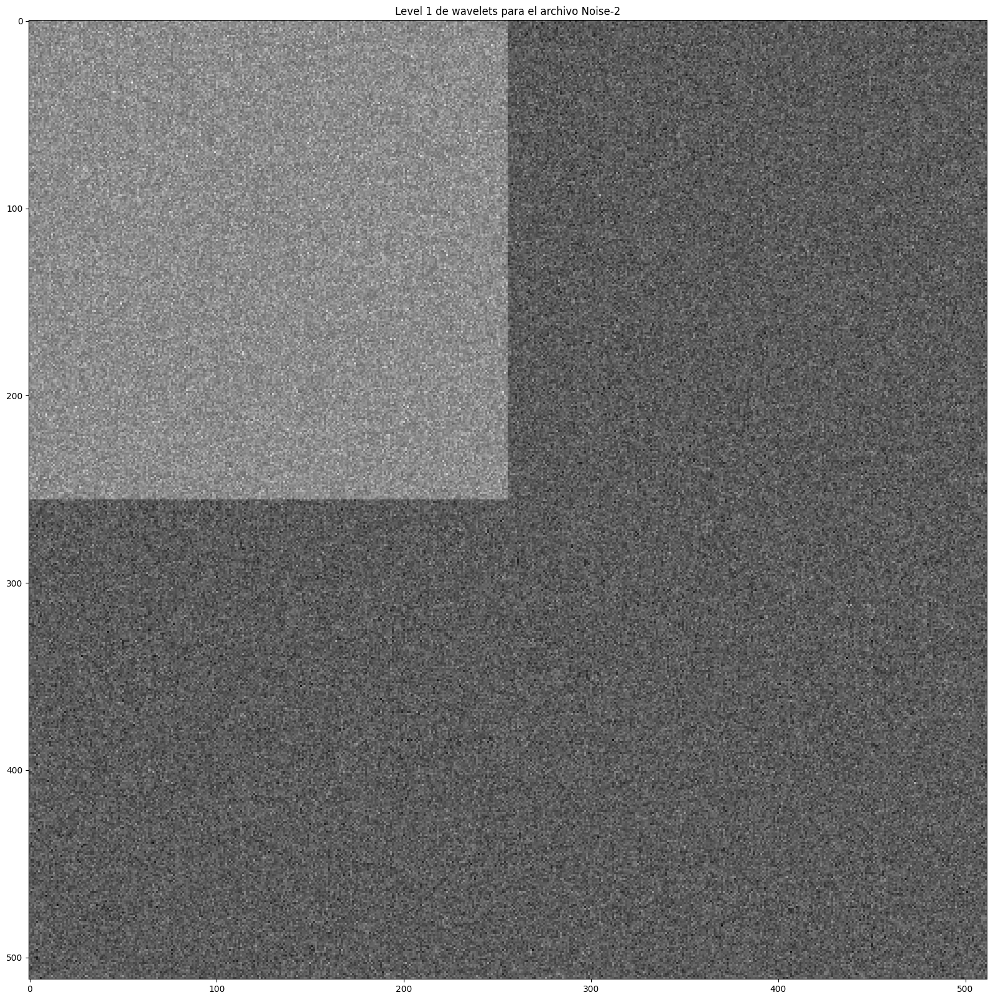

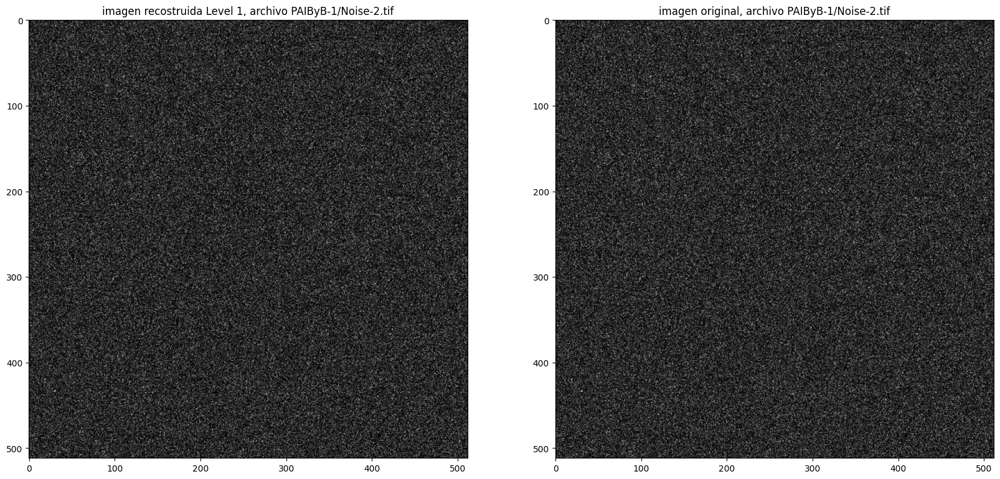

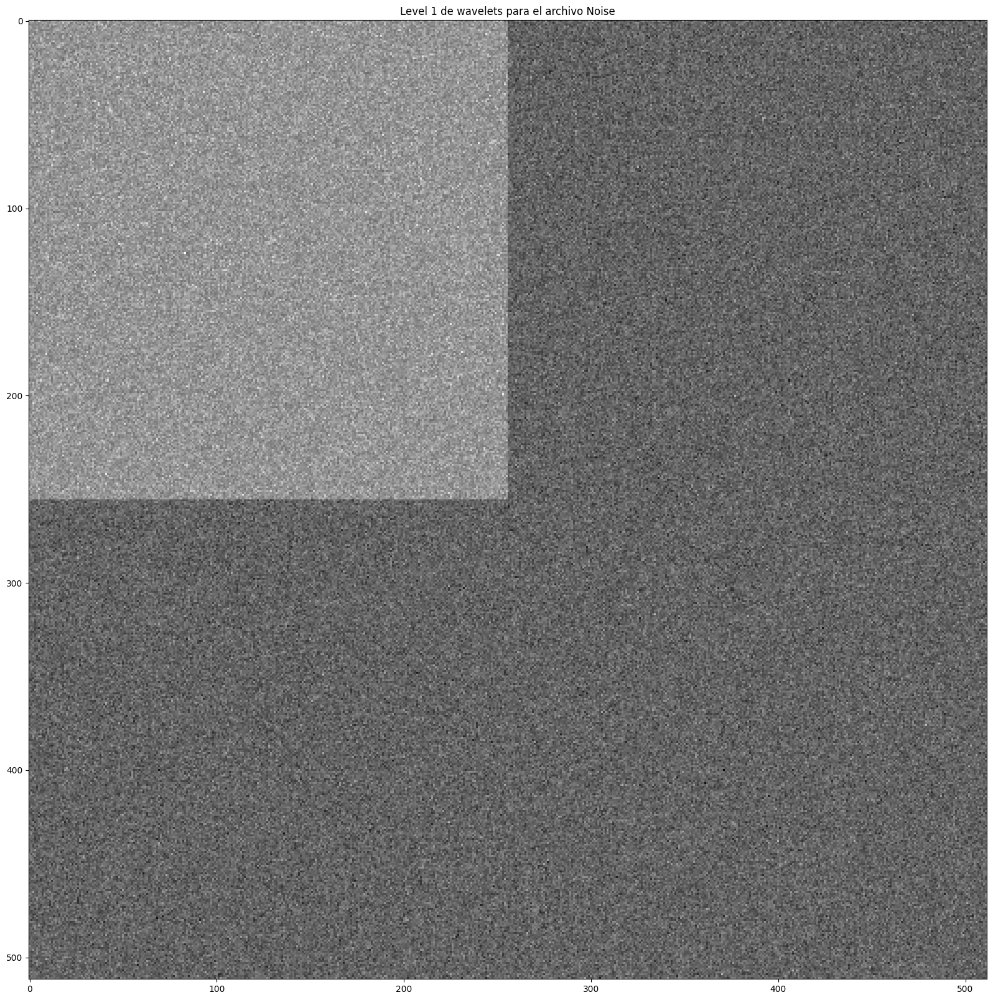

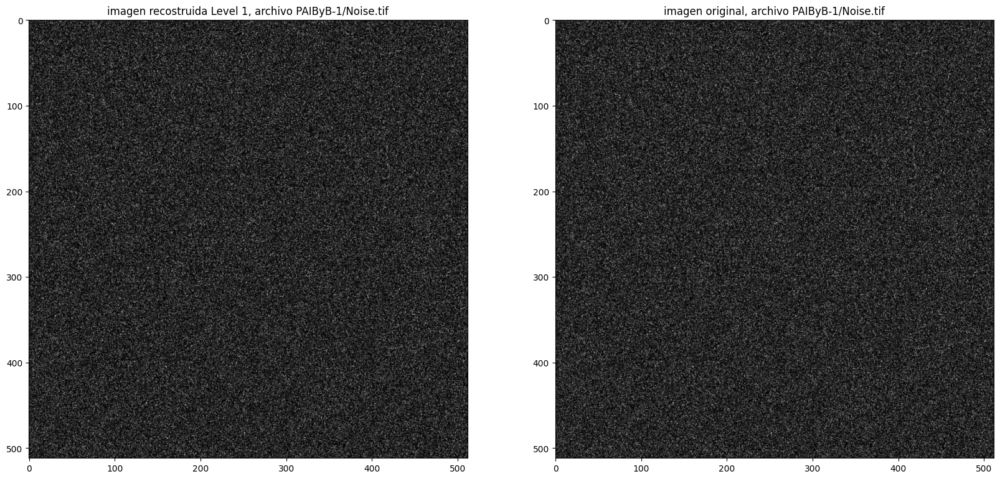

In [9]:
Level = 1
componentes = ['v','h','d','todos']
output_dir = 'noise_estimation/wavelet_estimation'

for image_path2 in noise_paths:
    noise = image_path2.split('/')[-1].split('.')[0] 
    image2 = cv2.imread(image_path2, cv2.IMREAD_GRAYSCALE) 
    image2 = np.float32(image2) 
    
    #plot all coef 
    imag_rec2, coeffs2 = test_wavelet.Wavelet2(image_path2,Level= 1,Plot_all_levels= False, Plot_reconstructed_imagestructed= False)
        
    cv2.imwrite(os.path.join(output_dir,f"{noise}_wavelet.png"), imag_rec2)
    
    coeff_arr2,coefs_slices2 = pywt.coeffs_to_array(coeffs2,)
    plt.figure(figsize=(20,20))
    plt.imshow(coeff_arr2, cmap = plt.cm.gray )
    plt.title(f'Level {Level} de wavelets para el archivo {noise}')
    plt.show()
    
     #plot rec Vs orig
    plt.figure(figsize=(20,20))
    plt.subplot(1,2,1)
    plt.imshow(imag_rec2,cmap = plt.cm.gray )
    plt.title(f'imagen recostruida Level {Level}, archivo {image_path2}')
    
    plt.subplot(1,2,2)
    plt.imshow(image2,cmap = plt.cm.gray )
    plt.title(f'imagen original, archivo {image_path2}')
    
    plt.show()

### Reconstruccion

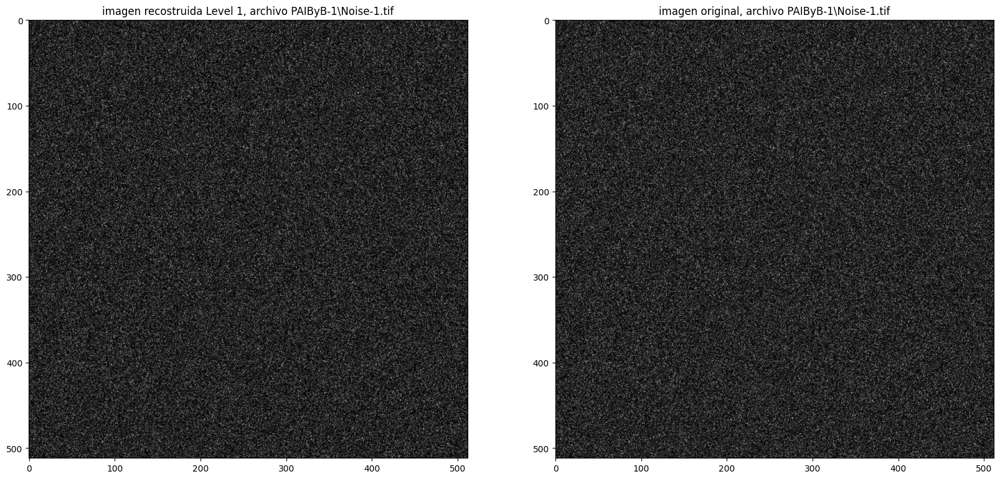

### Ruido de alta frecuencia

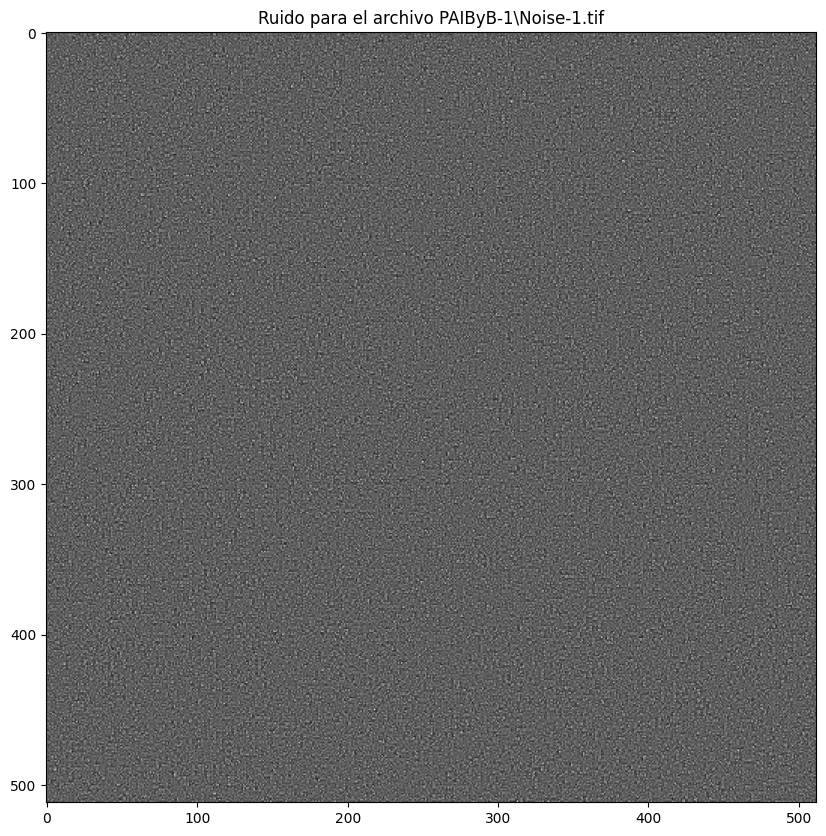

In [37]:
#plot todo el ruido
imag_Ruido_todo, coef_ruido =test_wavelet.read_coef(image_path= image_path2,Coeffs= coeffs2,level = Level,plot= False,coef_a_mostrar_vhd='todos')
plt.figure(figsize=(10,10))
plt.imshow(imag_Ruido_todo,cmap = plt.cm.gray )
plt.title(f'Ruido para el archivo {image_path2}')
plt.show()

## Pie

### inicializacion de variables

In [18]:
Level = 1
componentes = ['v','h','d','todos']
image_path = pies_paths[1]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) 
image = np.float32(image) 




### Todas las componentes de ruido 

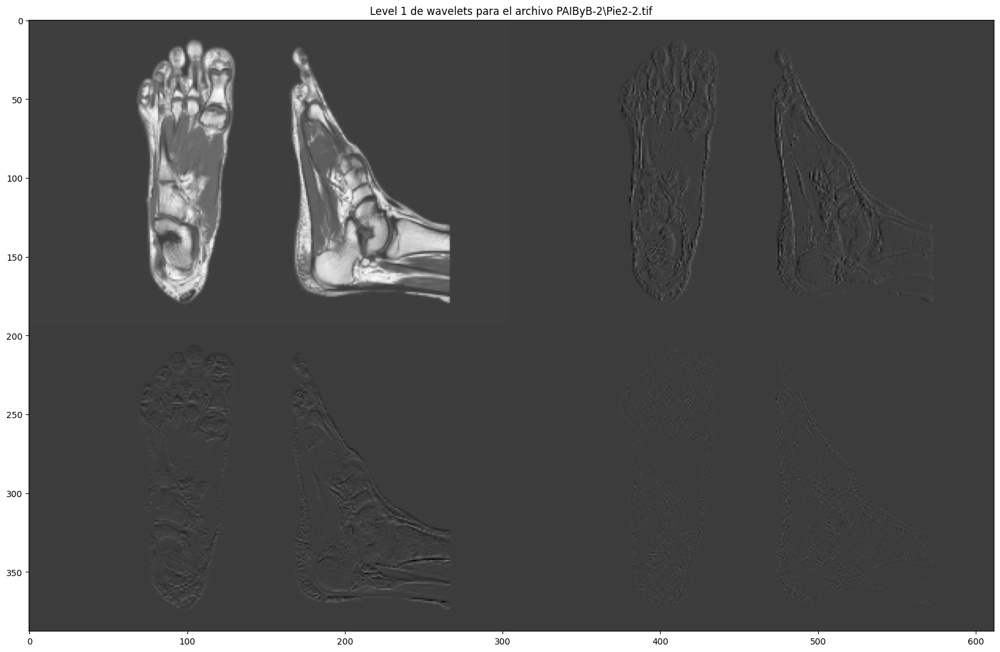

In [26]:
#plot all coef 
imag_rec, coeffs = test_wavelet.Wavelet2(image_path,Level= 1,Plot_all_levels= False, Plot_reconstructed_imagestructed= False)
coeff_arr,coefs_slices = pywt.coeffs_to_array(coeffs,)
plt.figure(figsize=(20,20))
plt.imshow(coeff_arr,cmap = plt.cm.gray )
plt.title(f'Level {Level} de wavelets para el archivo {image_path}')
plt.show()




### Reconstrucion de la imagen 

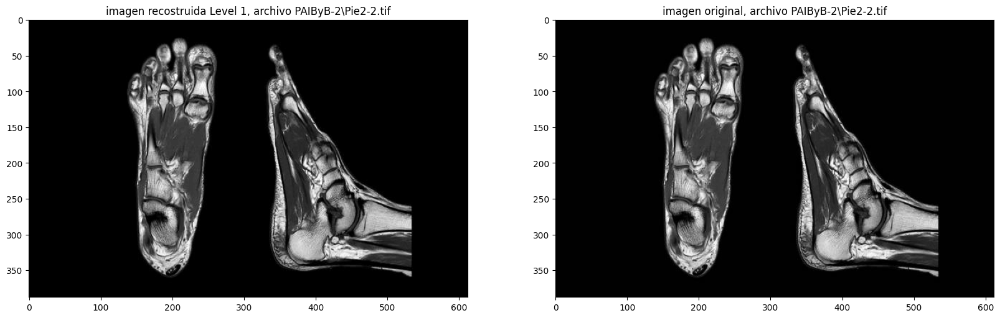

In [27]:
 #plot rec Vs orig

plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(imag_rec,cmap = plt.cm.gray )
plt.title(f'imagen recostruida Level {Level}, archivo {image_path}')

plt.subplot(1,2,2)
plt.imshow(image,cmap = plt.cm.gray )
plt.title(f'imagen original, archivo {image_path}')



plt.show()

### Todo el ruido de alta frecuencia

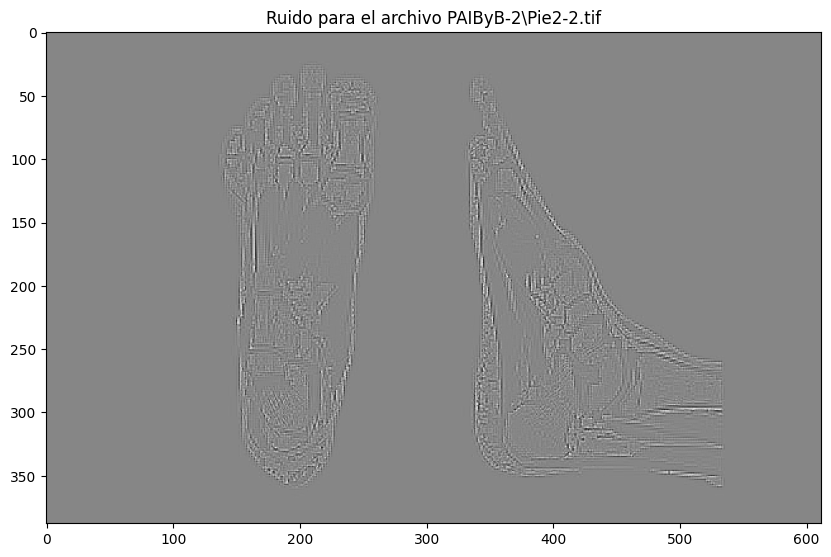

In [30]:
#plot todo el ruido
imag_Ruido_todo, coef_ruido =test_wavelet.read_coef(image_path= image_path,Coeffs= coeffs,level = Level,plot= False,coef_a_mostrar_vhd='todos')
plt.figure(figsize=(10,10))
plt.imshow(imag_Ruido_todo,cmap = plt.cm.gray )
plt.title(f'Ruido para el archivo {image_path}')
plt.show()


        

## 2.3 Filtrado de ruido de alta frecuencia con Wavelets

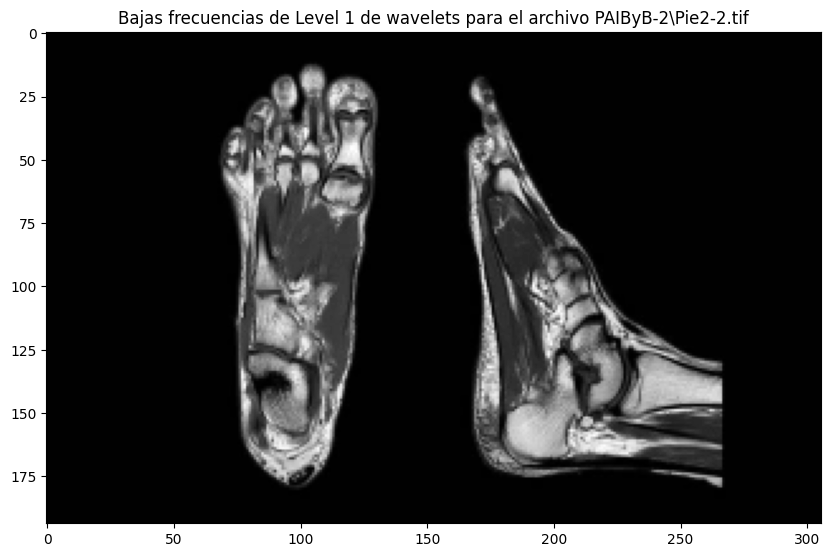

In [31]:
plt.figure(figsize=(10,10))
plt.imshow(coeffs[0],cmap = plt.cm.gray )
plt.title(f'Bajas frecuencias de Level {Level} de wavelets para el archivo {image_path}')
plt.show()